In [122]:
using Revise
using Distributions
using LinearAlgebra
using ColorSchemes
using Plots
default(label="", guidefontsize=15, tickfontsize=10, legendfontsize=15, margin=15Plots.pt)

includet("../FreeEnergyAgents.jl"); using. FreeEnergyAgents
includet("../util.jl")

In [123]:
# Nonlinear observation
g(x::AbstractVector) = [sqrt(x[1]^2 + x[2]^2), atan(x[2],x[1])]

# Measurement noise
σ = 1e-3
R = diagm(σ^2*ones(2));

In [124]:
# Distribution around goal state
z_star = [0., 1., 0., 0.]
goal = (g(z_star), 0.5diagm(ones(2)))

([1.0, 1.5707963267948966], [0.5 0.0; 0.0 0.5])

In [125]:
function helper0(x,y, goal; D=2, R=diagm(ones(2)), S_t=diagm(ones(2)))

    μ, Σ, Γ = ET1([x; y], S_t, g, addmatrix=R, forceHermitian=true)
    return risk(μ,Σ, goal) + ambiguity(Σ,Γ, S_t)

end

function helper1(x,y, goal; D=2, R=diagm(ones(2)), S_t=diagm(ones(2)))

    μ, Σ, Γ = ET2([x; y], S_t, g, addmatrix=R, forceHermitian=true)
    return risk(μ,Σ, goal)

end

function helper2(x,y, goal; D=2, R=diagm(ones(2)), S_t=diagm(ones(2)))

    μ, Σ, Γ = ET2([x; y], S_t, g, addmatrix=R, forceHermitian=true)
    return risk(μ,Σ, goal) + ambiguity(Σ,Γ, S_t)

end

helper2 (generic function with 2 methods)

In [126]:
xl = [-1.5, 1.5]
yl = [-.8, 2.2]

Nr = 100
xr = range(xl[1], stop=xl[2], length=Nr)
yr = range(yl[1], stop=yl[2], length=Nr)

-0.8:0.030303030303030304:2.2

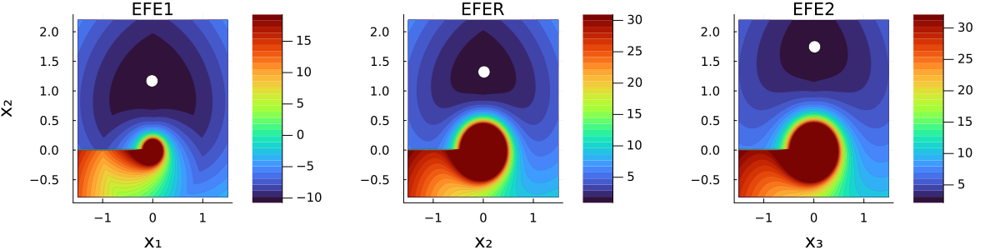

In [133]:
goal = (g(z_star), 0.5diagm(ones(2)))

EFEg0 = zeros(Nr,Nr)
for (ii,x) in enumerate(xr)
    for (jj,y) in enumerate(yr)
        EFEg0[ii,jj] = helper0(x,y, goal, R=R, S_t=diagm(ones(2)))
    end
end
ming0 = argmin(EFEg0)

EFEg1 = zeros(Nr,Nr)
for (ii,x) in enumerate(xr)
    for (jj,y) in enumerate(yr)
        EFEg1[ii,jj] = helper1(x,y, goal, R=R, S_t=diagm(ones(2)))
    end
end
ming1 = argmin(EFEg1)

EFEg2 = zeros(Nr,Nr)
for (ii,x) in enumerate(xr)
    for (jj,y) in enumerate(yr)
        EFEg2[ii,jj] = helper2(x,y, goal, R=R, S_t=diagm(ones(2)))
    end
end
ming2 = argmin(EFEg2)

p11 = contourf(xr,yr, (xr,yr) -> helper0(xr,yr,goal; R=R), colormap=:turbo, nlevels=30, linewidth=0, clims=(EFEg0[ming0],EFEg0[ming0]+30), ylabel="x₂")
scatter!([xr[ming0[1]]], [yr[ming0[2]]], color="white", markersize=8, xticks=[-1.,0.,1.], title="EFE1", xlabel="x₁")
p12 = contourf(xr,yr, (xr,yr) -> helper1(xr,yr,goal; R=R), colormap=:turbo, nlevels=30, linewidth=0, clims=(EFEg1[ming1],EFEg1[ming1]+30),)
scatter!([xr[ming1[1]]], [yr[ming1[2]]], color="white", markersize=8, xticks=[-1.,0.,1.], title="EFER", xlabel="x₂")
p13 = contourf(xr,yr, (xr,yr) -> helper2(xr,yr,goal; R=R), colormap=:turbo, nlevels=30, linewidth=0, clims=(EFEg2[ming2],EFEg2[ming2]+30),)
scatter!([xr[ming2[1]]], [yr[ming2[2]]], color="white", markersize=8, xticks=[-1.,0.,1.], title="EFE2", xlabel="x₃")

l = @layout [a b c ; d e f]
plot(p11, p12, p13, layout=(1,3), size=(1200,300), left_margin=15Plots.pt, bottom_margin=20Plots.pt, margin=0Plots.pt)

In [134]:
savefig("figures/cart2polar-ambiguity-contourf.png")

"c:\\Syndr\\Wouter\\Onderzoek\\Projecten\\tue\\efe-planning\\IWAI2024-ambiguity\\demonstrations\\figures\\cart2polar-ambiguity-contourf.png"

In [118]:
goal = (g(z_star), 0.5diagm(ones(2)))

EFEg0 = zeros(Nr,Nr)
for (ii,x) in enumerate(xr)
    for (jj,y) in enumerate(yr)
        EFEg0[ii,jj] = helper0(x,y, goal, R=R, S_t=diagm(ones(2)))
    end
end
ming0 = argmin(EFEg0)

EFEg1 = zeros(Nr,Nr)
for (ii,x) in enumerate(xr)
    for (jj,y) in enumerate(yr)
        EFEg1[ii,jj] = helper1(x,y, goal, R=R, S_t=diagm(ones(2)))
    end
end
ming1 = argmin(EFEg1)

EFEg2 = zeros(Nr,Nr)
for (ii,x) in enumerate(xr)
    for (jj,y) in enumerate(yr)
        EFEg2[ii,jj] = helper2(x,y, goal, R=R, S_t=diagm(ones(2)))
    end
end
ming2 = argmin(EFEg2)

p11 = contourf(xr,yr, (xr,yr) -> helper0(xr,yr,goal; R=R), colormap=:turbo, nlevels=30, linewidth=0, clims=(EFEg0[ming0],EFEg0[ming0]+30), ylabel="x₂")
scatter!([xr[ming0[1]]], [yr[ming0[2]]], color="white", markersize=8, xticks=[-1.,0.,1.], title="EFE1")
p12 = contourf(xr,yr, (xr,yr) -> helper1(xr,yr,goal; R=R), colormap=:turbo, nlevels=30, linewidth=0, clims=(EFEg1[ming1],EFEg1[ming1]+30),)
scatter!([xr[ming1[1]]], [yr[ming1[2]]], color="white", markersize=8, xticks=[-1.,0.,1.], title="EFER")
p13 = contourf(xr,yr, (xr,yr) -> helper2(xr,yr,goal; R=R), colormap=:turbo, nlevels=30, linewidth=0, clims=(EFEg2[ming2],EFEg2[ming2]+30),)
scatter!([xr[ming2[1]]], [yr[ming2[2]]], color="white", markersize=8, xticks=[-1.,0.,1.], title="EFE2")

goal = (g(z_star), 0.1diagm(ones(2)))

EFEg0 = zeros(Nr,Nr)
for (ii,x) in enumerate(xr)
    for (jj,y) in enumerate(yr)
        EFEg0[ii,jj] = helper0(x,y, goal, R=R, S_t=diagm(ones(2)))
    end
end
ming0 = argmin(EFEg0)

EFEg1 = zeros(Nr,Nr)
for (ii,x) in enumerate(xr)
    for (jj,y) in enumerate(yr)
        EFEg1[ii,jj] = helper1(x,y, goal, R=R, S_t=diagm(ones(2)))
    end
end
ming1 = argmin(EFEg1)

EFEg2 = zeros(Nr,Nr)
for (ii,x) in enumerate(xr)
    for (jj,y) in enumerate(yr)
        EFEg2[ii,jj] = helper2(x,y, goal, R=R, S_t=diagm(ones(2)))
    end
end
ming2 = argmin(EFEg2)

p21 = contourf(xr,yr, (xr,yr) -> helper0(xr,yr,goal; R=R), colormap=:turbo, nlevels=30, linewidth=0, clims=(EFEg0[ming0],EFEg0[ming0]+30),xlabel="x₁", ylabel="x₂")
scatter!([xr[ming0[1]]], [yr[ming0[2]]], color="white", markersize=8, xticks=[-1.,0.,1.])
p22 = contourf(xr,yr, (xr,yr) -> helper1(xr,yr,goal; R=R), colormap=:turbo, nlevels=30, linewidth=0, clims=(EFEg1[ming1],EFEg1[ming1]+30),xlabel="x₁")
scatter!([xr[ming1[1]]], [yr[ming1[2]]], color="white", markersize=8, xticks=[-1.,0.,1.])
p23 = contourf(xr,yr, (xr,yr) -> helper2(xr,yr,goal; R=R), colormap=:turbo, nlevels=30, linewidth=0, clims=(EFEg2[ming2],EFEg2[ming2]+30),xlabel="x₁")
scatter!([xr[ming2[1]]], [yr[ming2[2]]], color="white", markersize=8, xticks=[-1.,0.,1.]);

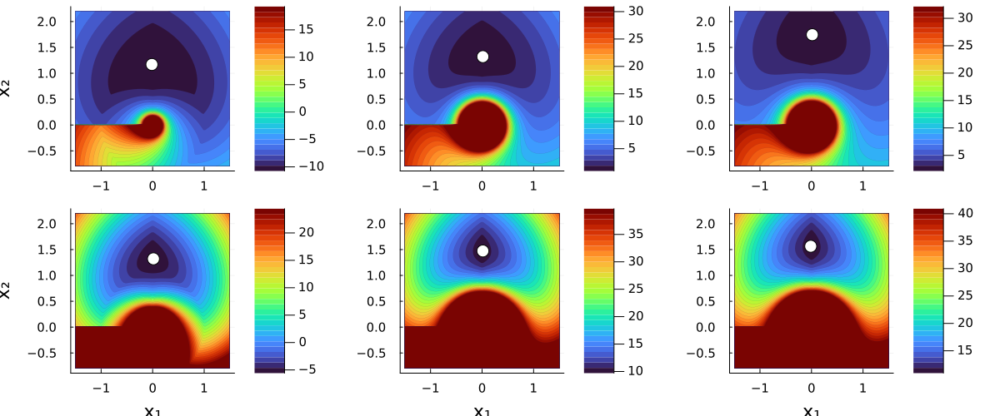

In [119]:
l = @layout [a b c ; d e f]
plot(p11, p12, p13, p21, p22, p23, layout=l, size=(1200,500), left_margin=10Plots.pt, bottom_margin=10Plots.pt, margin=0Plots.pt)

In [120]:
savefig("figures/cart2polar-ambiguity-contourf.png")

"c:\\Syndr\\Wouter\\Onderzoek\\Projecten\\tue\\efe-planning\\IWAI2024-ambiguity\\demonstrations\\figures\\cart2polar-ambiguity-contourf.png"

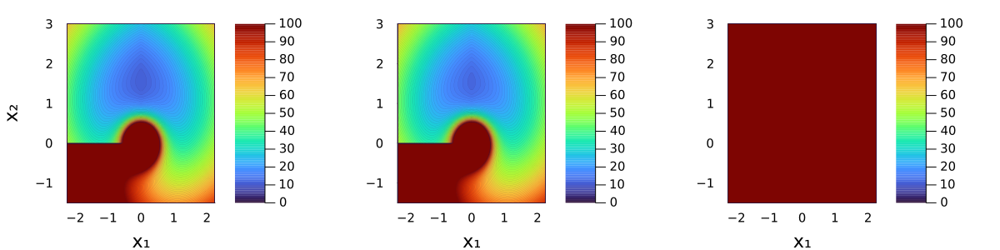

In [98]:
p31 = contourf(xr,yr, (xr,yr) -> helper2(xr,yr, goal, R=1e-3diagm(ones(2)), S_t=1e0diagm(ones(2))), colormap=:turbo, clims=(0.,100.), nlevels=100, linewidth=0, xlabel="x₁", ylabel="x₂")
p32 = contourf(xr,yr, (xr,yr) -> helper2(xr,yr, goal, R=1e-1diagm(ones(2)), S_t=1e0diagm(ones(2))), colormap=:turbo, clims=(0.,100.), nlevels=100, linewidth=0, xlabel="x₁")
p33 = contourf(xr,yr, (xr,yr) -> helper2(xr,yr, goal, R=1e1diagm(ones(2)), S_t=1e0diagm(ones(2))), colormap=:turbo, clims=(0.,100.), nlevels=100, linewidth=0, xlabel="x₁")
plot(p31,p32,p33, layout=(1,3), size=(1200,300), bottom_margin=20Plots.pt, left_margin=20Plots.pt)


In [99]:
savefig("figures/cart2polar-ambiguity-contourf-3.png")

"c:\\Syndr\\Wouter\\Onderzoek\\Projecten\\tue\\efe-planning\\IWAI2024-ambiguity\\demonstrations\\figures\\cart2polar-ambiguity-contourf-3.png"

In [100]:
contourf(xr,yr, (xr,yr) -> helper2(xr,yr, goal, S_t=1e-2diagm(ones(2))), nlevels=100, clims=(0.,30.), linewidth=0, xlabel="x₁", ylabel="x₂", size=(500,400))
savefig("figures/cart2polar-ambiguity-contourf-S1.png")
contourf(xr,yr, (xr,yr) -> helper2(xr,yr, goal, S_t=1e0diagm(ones(2))), nlevels=100, clims=(0.,30.), linewidth=0, xlabel="x₁", size=(500,400))
savefig("figures/cart2polar-ambiguity-contourf-S2.png")
contourf(xr,yr, (xr,yr) -> helper2(xr,yr, goal, S_t=1e2diagm(ones(2))), nlevels=100, clims=(0.,30.), linewidth=0, xlabel="x₁", size=(500,400))
savefig("figures/cart2polar-ambiguity-contourf-S3.png")

"c:\\Syndr\\Wouter\\Onderzoek\\Projecten\\tue\\efe-planning\\IWAI2024-ambiguity\\demonstrations\\figures\\cart2polar-ambiguity-contourf-S3.png"